# The Explainer Notebook - Group 38 
### Ying Lu (s232177) and Susanna Porcelli (s232698)

## Motivation
### What is your dataset?
>There are 3 datasets involved in this project：
> - Rent ordinanc housing inventory
> - Fire department calls for service
> - Neighborhoods San Francisco 2004
### Why did you choose this/these particular dataset(s)?
>We chose these datasets because they provide valuable insights into two crucial aspects of our study: fire incidents and neighborhood economic levels in San Francisco. 
>
>The "Fire Department Calls for Service" dataset allows us to analyze fire patterns and response times, which are essential for understanding emergency services' effectiveness. 
>On the other hand, the "Rent Ordinance Housing Inventory" dataset documents rental market prices, providing indicators of neighborhood economic status. 
> We utilize the 'Neighborhoods San Francisco 2004' GeoJSON dataset to visualize neighborhood boundaries. This help with understanding fire rescue resource allocation and  economic level.
>
> By combining these datasets, we aim to uncover any potential correlations between fire incidents, response times, and neighborhood economic levels, aiding in better understanding and potentially improving fire emergency services in San Francisco.
### What was your goal for the end user's experience?
> Reveling fire emergency patterns on both time and location aspect, and rescue resources distribution in San Francisco.
> And to answe the question of which area can you live in to get rescue faster？


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#TAKES A LONG FUCKING TIME
firedf = pd.read_csv("Fire_Department_Calls_for_Service_20240414.csv")

C:\Users\ALW\AppData\Local\Temp\ipykernel_18024\1740023720.py:2: DtypeWarning: Columns (19,20,25) have mixed types. Specify dtype option on import or set low_memory=False.
  firedf = pd.read_csv("Fire_Department_Calls_for_Service_20240414.csv")


## Basic stats
### Write about your choices in data cleaning and preprocessing
>**Fire Calls:**
> - Data Reduction: Due to the large size of the fire call dataset causing slow processing, we narrowed our focus to fire incidents in San Francisco from 2019 to 2023. We filtered for call types specifically related to fire incidents to conduct further analysis.
>
> - Time Data Establishment: We calculated the time gap from receiving the call to the fire department's arrival.Subsequently, we determined the average response time for each neighborhood.
>
> - Eliminate erros: Printing all the minimum and maximum values.Eliminate the unreasonable data, such as time differences less than or equal to 0.
>
>**Rent:**
> - Selected representative rent data:  Since there were no significant changes in San Francisco's economic development ranking between 2019 and 2023, we chose the latest rent statistics from 2023 to represent the area's economic status. To ensure accuracy, we only utilized occupancy situations classified as "occupied by non-owner," removing outliers where rent equals 0.
>
> - Clculate average Rent per Square Foot: Because the statistical presentation of both area and rent in intervals, we computed the average of the upper and lower bounds of each interval to represent the property's area and rent. We then divided the average rent by the average area to determine the average rent per square foot for each neighborhood.
>
> **Geo Jason:**
> - Consistent Area Division: As there were difference in geographical divisions among the three datasets regarding place names and regions, we manually resolved these inconsistencies by referencing internet sources.

In [3]:
wanted_call_types = ["Alarms", "Electrical Hazard", "Explosion", "Lightning Strike (Investigation)", "Marine Fire", "Outside Fire", 
                     "Smoke Investigation (Outside)", "Structure Fire", "Train / Rail Fire", "Vehicle Fire"]

firedf = firedf[firedf["Call Type"].isin(wanted_call_types)]
firedf['Call Date'] = pd.to_datetime(firedf['Call Date'])
firedf.index = firedf["Call Date"]
firedf = firedf.sort_index()
firedf = firedf.loc["2019-01-01":"2023-12-31"]
firedf = firedf[firedf["Received DtTm"].notnull()]
firedf = firedf[firedf["On Scene DtTm"].notnull()]
firedf = firedf[firedf["Neighborhooods - Analysis Boundaries"].notnull()]
firedf = firedf[~firedf["Neighborhooods - Analysis Boundaries"].isin(["Treasure Island"])]
firedf["Neighborhooods - Analysis Boundaries"] = firedf["Neighborhooods - Analysis Boundaries"].replace({"Hayes Valley": "Western Addition",
                                                        "Lone Mountain/USF": "Inner Richmond",
                                                        "McLaren Park": "Visitacion Valley","Japantown": "Western Addition",
                                                        "Lincoln Park": "Seacliff","Oceanview/Merced/Ingleside": "Ocean View",
                                                        "Financial District/South Beach": "Financial District","Portola": "Excelsior",
                                                        "Tenderloin": "Downtown/Civic Center","Mission Bay": "South of Market",
                                                        "Bayview Hunters Point": "Bayview"})
firedf = firedf[firedf["Received DtTm"] != firedf["On Scene DtTm"]]
received_series = pd.to_datetime(firedf["Received DtTm"])
on_scene_series = pd.to_datetime(firedf["On Scene DtTm"])
response_times = (on_scene_series-received_series).astype('timedelta64[ns]')
firedf["Response times"] = response_times
firedf = firedf[response_times.dt.total_seconds() > 0]
firedf.index = pd.to_datetime(firedf["Received DtTm"])
firedf = firedf.sort_index()
firedf

,Call Number,Unit ID,Incident Number,Call Type,Call Date,Watch Date,Received DtTm,Entry DtTm,Dispatch DtTm,Response DtTm,...,Unit sequence in call dispatch,Fire Prevention District,Supervisor District,Neighborhooods - Analysis Boundaries,RowID,case_location,data_as_of,data_loaded_at,Analysis Neighborhoods,Response times
Received DtTm,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:07:30,190010050,B08,19000005,Outside Fire,2019-01-01,12/31/2018,01/01/2019 12:07:30 AM,01/01/2019 12:08:16 AM,01/01/2019 12:08:34 AM,01/01/2019 12:10:44 AM,...,2.0,9.0,7.0,West of Twin Peaks,190010050-B08,POINT (-122.45801 37.736103),02/05/2024 03:27:52 AM,02/05/2024 10:56:25 AM,41.0,0 days 00:06:56
2019-01-01 00:07:30,190010050,E40,19000005,Outside Fire,2019-01-01,12/31/2018,01/01/2019 12:07:30 AM,01/01/2019 12:08:16 AM,01/01/2019 12:08:34 AM,01/01/2019 12:12:11 AM,...,6.0,9.0,7.0,West of Twin Peaks,190010050-E40,POINT (-122.45801 37.736103),02/05/2024 03:27:52 AM,02/05/2024 10:56:25 AM,41.0,0 days 00:11:29
2019-01-01 00:07:30,190010050,T19,19000005,Outside Fire,2019-01-01,12/31/2018,01/01/2019 12:07:30 AM,01/01/2019 12:08:16 AM,01/01/2019 12:08:34 AM,01/01/2019 12:09:50 AM,...,5.0,9.0,7.0,West of Twin Peaks,190010050-T19,POINT (-122.45801 37.736103),02/05/2024 03:27:52 AM,02/05/2024 10:56:25 AM,41.0,0 days 00:09:44
2019-01-01 00:07:30,190010050,E15,19000005,Outside Fire,2019-01-01,12/31/2018,01/01/2019 12:07:30 AM,01/01/2019 12:08:16 AM,01/01/2019 12:08:34 AM,01/01/2019 12:10:15 AM,...,7.0,9.0,7.0,West of Twin Peaks,190010050-E15,POINT (-122.45801 37.736103),02/05/2024 03:27:52 AM,02/05/2024 10:56:25 AM,41.0,0 days 00:27:03
2019-01-01 00:07:30,190010050,E39,19000005,Outside Fire,2019-01-01,12/31/2018,01/01/2019 12:07:30 AM,01/01/2019 12:08:16 AM,01/01/2019 12:08:34 AM,01/01/2019 12:10:11 AM,...,1.0,9.0,7.0,West of Twin Peaks,190010050-E39,POINT (-122.45801 37.736103),02/05/2024 03:27:52 AM,02/05/2024 10:56:25 AM,41.0,0 days 00:06:39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-31 23:08:10,233653065,E03,23177194,Alarms,2023-12-31,12/31/2023,12/31/2023 11:08:10 PM,12/31/2023 11:09:21 PM,12/31/2023 11:09:28 PM,12/31/2023 11:10:16 PM,...,1.0,2.0,6.0,Downtown/Civic Center,233653065-E03,POINT (-122.41424 37.783722),02/05/2024 03:27:52 AM,02/05/2024 10:56:25 AM,36.0,0 days 00:04:46
2023-12-31 23:30:19,233653128,B01,23177205,Alarms,2023-12-31,12/31/2023,12/31/2023 11:30:19 PM,12/31/2023 11:32:04 PM,12/31/2023 11:33:59 PM,12/31/2023 11:36:07 PM,...,3.0,1.0,3.0,North Beach,233653128-B01,POINT (-122.40815 37.803432),02/05/2024 03:27:52 AM,02/05/2024 10:56:25 AM,23.0,0 days 00:09:13
2023-12-31 23:30:19,233653128,E28,23177205,Alarms,2023-12-31,12/31/2023,12/31/2023 11:30:19 PM,12/31/2023 11:32:04 PM,12/31/2023 11:33:59 PM,12/31/2023 11:35:24 PM,...,1.0,1.0,3.0,North Beach,233653128-E28,POINT (-122.40815 37.803432),02/05/2024 03:27:52 AM,02/05/2024 10:56:25 AM,23.0,0 days 00:06:03


In [4]:
def convert_point_to_tuple(point_entry):
    return eval(",".join(point_entry.split("POINT ")[1].split(" ")))
rentdf = pd.read_csv("Rent_Ordinance_Housing_Inventory_20240505.csv")
rentdf = rentdf[rentdf["submission_year"]==2023]
rentdf = rentdf[rentdf["occupancy_type"]=="Occupied by non-owner"]
rentdf = rentdf[rentdf["analysis_neighborhood"].notnull()]
rentdf["analysis_neighborhood"] = rentdf["analysis_neighborhood"].replace({"Hayes Valley": "Western Addition",
                                                        "Lone Mountain/USF": "Inner Richmond",
                                                        "McLaren Park": "Visitacion Valley","Japantown": "Western Addition",
                                                        "Lincoln Park": "Seacliff","Oceanview/Merced/Ingleside": "Ocean View",
                                                        "Financial District/South Beach": "Financial District","Portola": "Excelsior",
                                                        "Tenderloin": "Downtown/Civic Center","Mission Bay": "South of Market",
                                                        "Bayview Hunters Point": "Bayview"})
rentdf = rentdf[rentdf["point"].notnull()]
rentdf = rentdf[rentdf["monthly_rent"]!="$0 (no rent paid by the occupant)"]
rentdf = rentdf[rentdf["square_footage"]!="Unknown"]
rentdf["point"] = rentdf["point"].map(convert_point_to_tuple)
def get_mean_rent(elem):
    numbers = elem.split("-$")
    if len(numbers)==1:
        numbers[0]=int(numbers[0].replace("$","").replace("+",""))
        return int(numbers[0])
    elif len(numbers)==2:
        numbers[0]=int(numbers[0].replace("$","").replace("+",""))
        numbers[1]=int(numbers[1].replace("$","").replace("+",""))
        return sum(numbers)/2
    else:
        raise Exception(f"wtf? {elem} {numbers}")
    
rentdf["true_monthly_mean"] = rentdf["monthly_rent"].map(get_mean_rent)
def get_mean_footage(elem):
    numbers=elem.split(" Sq.Ft")[0].split("-")
    if len(numbers)==1:
        numbers[0] = numbers[0].split("+")[0]
        return int(numbers[0])
    elif len(numbers)==2:
        numbers[0]=int(numbers[0])
        numbers[1]=int(numbers[1])
        return sum(numbers)/2

rentdf["true_square_footage"] = rentdf["square_footage"].map(get_mean_footage)
rentdf

,unique_id,block_num,unit_count,case_type_name,submission_year,block_address,occupancy_type,occupancy_or_vacancy_date,occupancy_or_vacancy_date_year,bedroom_count,...,signature_date,occupancy_or_vacancy_date_history,year_property_built,point,analysis_neighborhood,supervisor_district,data_as_of,data_loaded_at,true_monthly_mean,true_square_footage
0,5784430458147580041,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2021/03/17,2021,Two-Bedroom,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,3125.5,875.5
1,4954451792168111171,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2016/03/12,2016,Studio,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1375.5,375.5
2,-5063247231305562579,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2021/12/15,2021,Studio,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,2375.5,625.5
3,-9079354581068241121,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2010/02/01,2010,One-Bedroom,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1875.5,875.5
4,756572995386429446,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2004/06/26,2004,One-Bedroom,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,2875.5,625.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152093,4047857095214640194,0065,74,Housing Inventory - Unit information (2023),2023,900 Block of COLUMBUS AVE,Occupied by non-owner,2022/10/27,2022,Studio,...,2023/02/17,"[\n {\n ""date_range_type"": ""Occupied"",\n ...",1916.0,"(-122.414343193, 37.80310132)",Russian Hill,3.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1375.5,125.0
152094,8790490401777245212,0065,74,Housing Inventory - Unit information (2023),2023,900 Block of COLUMBUS AVE,Occupied by non-owner,2017/12/14,2017,Studio,...,2023/02/17,NaN,1916.0,"(-122.414343193, 37.80310132)",Russian Hill,3.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1125.5,125.0
152095,4275828707947196532,0065,74,Housing Inventory - Unit information (2023),2023,900 Block of COLUMBUS AVE,Occupied by non-owner,2015/04/23,2015,Studio,...,2023/02/17,NaN,1916.0,"(-122.414343193, 37.80310132)",Russian Hill,3.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1125.5,125.0
152096,1350372243345719808,0065,74,Housing Inventory - Unit information (2023),2023,900 Block of COLUMBUS AVE,Occupied by non-owner,2020/08/07,2020,Studio,...,2023/02/17,NaN,1916.0,"(-122.414343193, 37.80310132)",Russian Hill,3.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1125.5,125.0


In [5]:
districts = ["Golden Gate Park","Sunset/Parkside","Seacliff","Presidio","Outer Richmond","Inner Sunset","Haight Ashbury","Presidio Heights",
             "Inner Richmond","North Beach","Russian Hill","Nob Hill","Chinatown","Downtown/Civic Center","Financial District","Marina",
             "Western Addition","Pacific Heights","South of Market","Mission","Bayview","Potrero Hill","Bernal Heights","Excelsior",
             "Visitacion Valley","Ocean View","Lakeshore","Glen Park","Twin Peaks","Castro/Upper Market","Noe Valley","Outer Mission",
             "West of Twin Peaks"] 
districtdict = {}
for district in districts:

    districtdf = firedf[firedf["Neighborhooods - Analysis Boundaries"]==district]
    rentdistrictdf = rentdf[rentdf["analysis_neighborhood"]==district]
    d_r_t = districtdf["Response times"]
    meanrent = np.mean(rentdistrictdf["true_monthly_mean"])
    meanfootage = np.mean(rentdistrictdf["true_square_footage"])
    mean_per_mean = meanrent/meanfootage if district!= "Presidio" else None
    districtdict.update({district: [np.mean(d_r_t.dt.total_seconds()/60),min(d_r_t.dt.total_seconds()/60),max(d_r_t.dt.total_seconds()/60),mean_per_mean]}) 

district_df = pd.DataFrame.from_dict(districtdict,orient="index")
district_df = district_df.reset_index()
district_df = district_df.rename(columns={"index": "NEIGHBORHO", 0: "Mean response time (min)", 1: "Fastest response time", 2:"Slowest response time",
                                          3:"Mean rent ($/ft^2)"})
district_df

,NEIGHBORHO,Mean response time (min),Fastest response time,Slowest response time,Mean rent ($/ft^2)
0,Golden Gate Park,8.285412,1.250000,281.716667,4.396416
1,Sunset/Parkside,7.792845,0.350000,263.350000,2.659374
2,Seacliff,8.268844,0.800000,82.200000,2.669059
3,Presidio,8.767269,1.966667,135.550000,NaN
4,Outer Richmond,7.193393,0.100000,107.650000,2.745444
5,Inner Sunset,7.218015,1.533333,90.300000,3.124437
6,Haight Ashbury,7.040618,0.100000,95.016667,3.419354
7,Presidio Heights,6.909119,1.116667,240.266667,3.208674
8,Inner Richmond,6.985809,1.633333,152.250000,3.050679
9,North Beach,6.732717,1.550000,55.416667,3.793911


In [6]:
tempdf = district_df.sort_values(by=["Mean response time (min)"])
tempdf["Speed rank"]=list(range(0,len(district_df)))
district_df = tempdf.sort_index()

tempdf = district_df.sort_values(by=["Mean rent ($/ft^2)"])
tempdf["Rent rank"]=list(range(len(district_df)-1,-1,-1))
district_df = tempdf.sort_index()
district_df

,NEIGHBORHO,Mean response time (min),Fastest response time,Slowest response time,Mean rent ($/ft^2),Speed rank,Rent rank
0,Golden Gate Park,8.285412,1.250000,281.716667,4.396416,28,1
1,Sunset/Parkside,7.792845,0.350000,263.350000,2.659374,20,27
2,Seacliff,8.268844,0.800000,82.200000,2.669059,27,26
3,Presidio,8.767269,1.966667,135.550000,NaN,31,0
4,Outer Richmond,7.193393,0.100000,107.650000,2.745444,15,25
5,Inner Sunset,7.218015,1.533333,90.300000,3.124437,16,19
6,Haight Ashbury,7.040618,0.100000,95.016667,3.419354,13,13
7,Presidio Heights,6.909119,1.116667,240.266667,3.208674,10,17
8,Inner Richmond,6.985809,1.633333,152.250000,3.050679,11,22
9,North Beach,6.732717,1.550000,55.416667,3.793911,5,5


In [7]:
def convert_point_to_tuple(point_entry):
    return eval(",".join(point_entry.split("POINT ")[1].split(" ")))
rentdf = pd.read_csv("Rent_Ordinance_Housing_Inventory_20240505.csv")
rentdf = rentdf[rentdf["submission_year"]==2023]
rentdf = rentdf[rentdf["occupancy_type"]=="Occupied by non-owner"]
rentdf = rentdf[rentdf["analysis_neighborhood"].notnull()]
rentdf["analysis_neighborhood"] = rentdf["analysis_neighborhood"].replace({"Hayes Valley": "Western Addition",
                                                        "Lone Mountain/USF": "Inner Richmond",
                                                        "McLaren Park": "Visitacion Valley","Japantown": "Western Addition",
                                                        "Lincoln Park": "Seacliff","Oceanview/Merced/Ingleside": "Ocean View",
                                                        "Financial District/South Beach": "Financial District","Portola": "Excelsior",
                                                        "Tenderloin": "Downtown/Civic Center","Mission Bay": "South of Market",
                                                        "Bayview Hunters Point": "Bayview"})
rentdf = rentdf[rentdf["point"].notnull()]
rentdf = rentdf[rentdf["monthly_rent"]!="$0 (no rent paid by the occupant)"]
rentdf = rentdf[rentdf["square_footage"]!="Unknown"]
rentdf["point"] = rentdf["point"].map(convert_point_to_tuple)
def get_mean_rent(elem):
    numbers = elem.split("-$")
    if len(numbers)==1:
        numbers[0]=int(numbers[0].replace("$","").replace("+",""))
        return int(numbers[0])
    elif len(numbers)==2:
        numbers[0]=int(numbers[0].replace("$","").replace("+",""))
        numbers[1]=int(numbers[1].replace("$","").replace("+",""))
        return sum(numbers)/2
    else:
        raise Exception(f"wtf? {elem} {numbers}")
    
rentdf["true_monthly_mean"] = rentdf["monthly_rent"].map(get_mean_rent)
def get_mean_footage(elem):
    numbers=elem.split(" Sq.Ft")[0].split("-")
    if len(numbers)==1:
        numbers[0] = numbers[0].split("+")[0]
        return int(numbers[0])
    elif len(numbers)==2:
        numbers[0]=int(numbers[0])
        numbers[1]=int(numbers[1])
        return sum(numbers)/2

rentdf["true_square_footage"] = rentdf["square_footage"].map(get_mean_footage)
rentdf

,unique_id,block_num,unit_count,case_type_name,submission_year,block_address,occupancy_type,occupancy_or_vacancy_date,occupancy_or_vacancy_date_year,bedroom_count,...,signature_date,occupancy_or_vacancy_date_history,year_property_built,point,analysis_neighborhood,supervisor_district,data_as_of,data_loaded_at,true_monthly_mean,true_square_footage
0,5784430458147580041,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2021/03/17,2021,Two-Bedroom,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,3125.5,875.5
1,4954451792168111171,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2016/03/12,2016,Studio,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1375.5,375.5
2,-5063247231305562579,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2021/12/15,2021,Studio,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,2375.5,625.5
3,-9079354581068241121,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2010/02/01,2010,One-Bedroom,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1875.5,875.5
4,756572995386429446,0750,142,Housing Inventory - Unit information (2023),2023,1400 Block of TURK ST,Occupied by non-owner,2004/06/26,2004,One-Bedroom,...,2023/02/28,NaN,1993.0,"(-122.432973442, 37.780445712)",Western Addition,5.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,2875.5,625.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152093,4047857095214640194,0065,74,Housing Inventory - Unit information (2023),2023,900 Block of COLUMBUS AVE,Occupied by non-owner,2022/10/27,2022,Studio,...,2023/02/17,"[\n {\n ""date_range_type"": ""Occupied"",\n ...",1916.0,"(-122.414343193, 37.80310132)",Russian Hill,3.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1375.5,125.0
152094,8790490401777245212,0065,74,Housing Inventory - Unit information (2023),2023,900 Block of COLUMBUS AVE,Occupied by non-owner,2017/12/14,2017,Studio,...,2023/02/17,NaN,1916.0,"(-122.414343193, 37.80310132)",Russian Hill,3.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1125.5,125.0
152095,4275828707947196532,0065,74,Housing Inventory - Unit information (2023),2023,900 Block of COLUMBUS AVE,Occupied by non-owner,2015/04/23,2015,Studio,...,2023/02/17,NaN,1916.0,"(-122.414343193, 37.80310132)",Russian Hill,3.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1125.5,125.0
152096,1350372243345719808,0065,74,Housing Inventory - Unit information (2023),2023,900 Block of COLUMBUS AVE,Occupied by non-owner,2020/08/07,2020,Studio,...,2023/02/17,NaN,1916.0,"(-122.414343193, 37.80310132)",Russian Hill,3.0,2024/05/04 12:00:00 AM,2024/05/05 06:07:07 AM,1125.5,125.0


### Write a short section that discusses the dataset stats, containing key points/plots from your exploratory data analysis.
> During our initial investigation, we looked into how fire incidents were spread out over different time periods. We noticed that the number of incidents varied widely across different types, and there wasn't any clear pattern over time.
>
> Also, the discrepancy in how areas were named across the three databases made it harder for us to study the differences between regions. This made our goal of understanding regional variations more challenging.

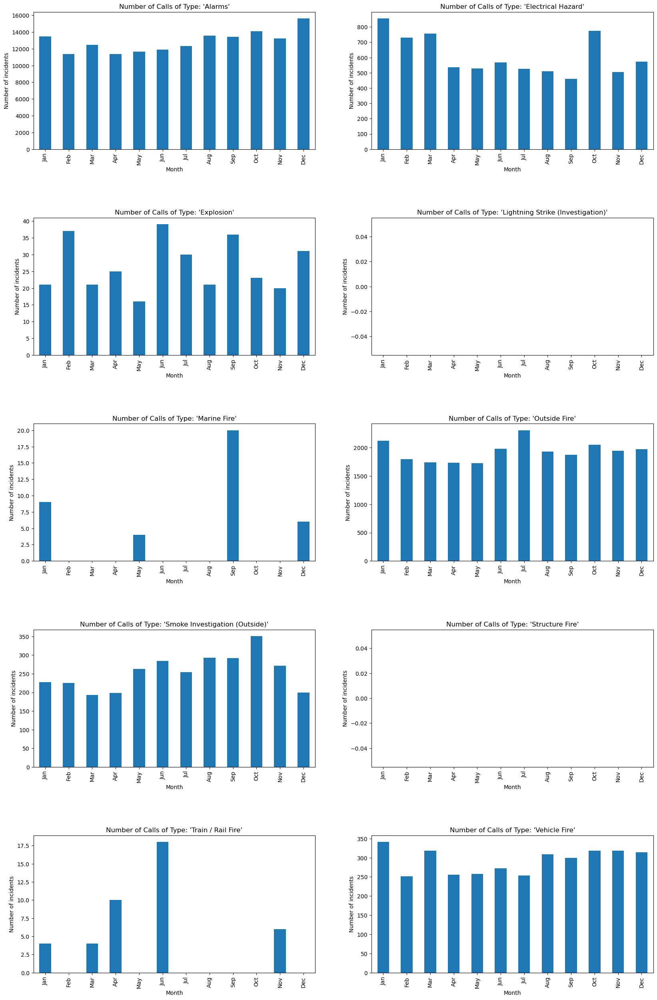

In [8]:
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
monthsnums = list(range(0, 12, 1))

num_rows = len(wanted_call_types) // 2 + len(wanted_call_types) % 2
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 30))
plt.subplots_adjust(left=0.125, right=0.9, bottom=0.1, top=0.9, wspace=0.2, hspace=0.5)  # 调整布局参数

for i, calltype in enumerate(wanted_call_types):
    calltypedf = firedf[firedf["Call Type"] == calltype]
    monthdict = {}
    for j, month in enumerate(months):
        monthdict.update({month: len(calltypedf[calltypedf.index.month == j + 1])})
        
    plot_df = pd.DataFrame([monthdict])
    ax = axes[i // num_cols, i % num_cols]
    plot_df.iloc[0].plot.bar(ax=ax)
    ax.set_ylabel("Number of incidents")
    ax.set_xlabel("Month")
    ax.set_xticks(monthsnums)
    ax.set_xticklabels(months)
    ax.set_title(f"Number of Calls of Type: '{calltype}'")

plt.show()

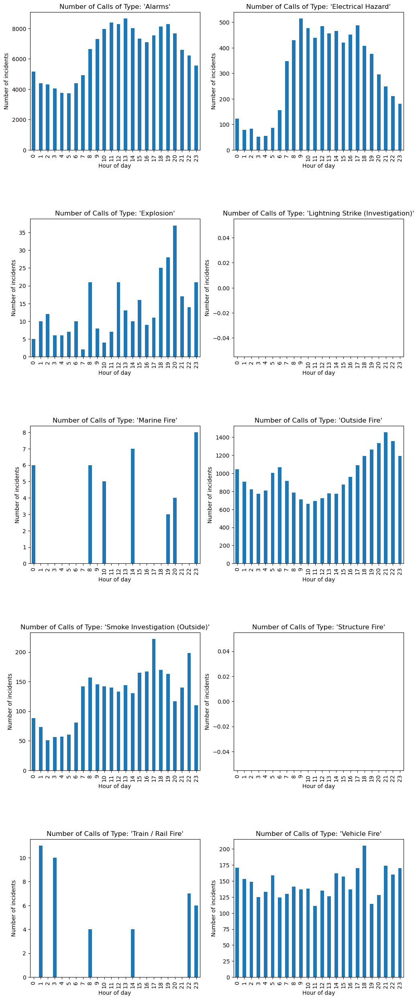

In [9]:
hournums = list(range(0, 24, 1))
num_rows = len(wanted_call_types) // 2 + len(wanted_call_types) % 2
num_cols = 2
fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 30))
plt.subplots_adjust(left=0.125, right=0.9, bottom=0.1, top=0.9, wspace=0.2, hspace=0.5)

for i, calltype in enumerate(wanted_call_types):
    calltypedf = firedf[firedf["Call Type"] == calltype]
    hourdict = {}
    for hour in hournums:
        hourdict.update({hour: len(calltypedf[calltypedf.index.hour==hour])})
        
    plot_df = pd.DataFrame([hourdict])
    ax = axes[i // num_cols, i % num_cols]
    plot_df.iloc[0].plot.bar(ax=ax)
    ax.set_ylabel("Number of incidents")
    ax.set_xlabel("Hour of day")
    ax.set_title(f"Number of Calls of Type: '{calltype}'")

plt.show()

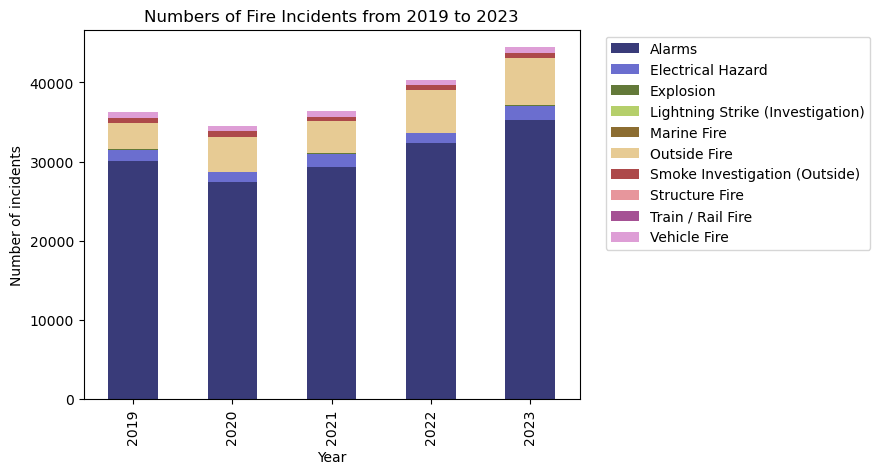

In [10]:
yearnums = list(range(2019, 2023+1, 1))
num_rows = 1
num_cols = 1

datadict = {year: [0 for _ in wanted_call_types] for year in yearnums}

for year in yearnums:
    for i, calltype in enumerate(wanted_call_types):
        calltypedf = firedf[firedf["Call Type"] == calltype]
        datadict[year][i] = len(calltypedf[calltypedf.index.year==year])


plot_df = pd.DataFrame.from_dict(datadict,orient='index',columns=wanted_call_types)
    
# ax = axes
# plot_df.iloc[0].plot.bar(ax=ax,stacked=True)
# ax.set_ylabel("Number of incidents")
# ax.set_xlabel("Year")
# ax.set_title(f"Number of Calls")

# plt.show()
ax = plot_df.plot.bar(stacked=True,colormap="tab20b")
ax.set_ylabel("Number of incidents")
ax.set_xlabel("Year")
ax.set_title(f"Numbers of Fire Incidents from 2019 to 2023")
leg = plt.legend( loc = 'upper right')

plt.draw() # Draw the figure so you can find the positon of the legend. 

# Get the bounding box of the original legend
bb = leg.get_bbox_to_anchor().transformed(ax.transAxes.inverted())

# Change to location of the legend. 
xOffset = 0.6
bb.x0 += xOffset
bb.x1 += xOffset
leg.set_bbox_to_anchor(bb, transform = ax.transAxes)

plt.show()


In [11]:
import plotly.express as px
import plotly.io as pio

import geopandas as gpd 
import shapely
gdf = gpd.read_file("ark28722-s75c8t-geojson.json")
gdf.to_crs(epsg=4326, inplace=True)
merge_gdf1 = gdf[gdf["NEIGHBORHO"].isin(["Outer Sunset", "Parkside"])]
merge_gdf2 = gdf[gdf["NEIGHBORHO"].isin(["Glen Park", "Diamond Heights"])]
merge_gdf3 = gdf[gdf["NEIGHBORHO"].isin(["Visitacion Valley", "Crocker Amazon"])]
gdf = gdf[~gdf["NEIGHBORHO"].isin(["Crocker Amazon","Parkside","Diamond Heights", "Parkside"])]
gdf[gdf["NEIGHBORHO"]=="Outer Sunset"]=["s75c8t.2",2,"Sunset/Parkside",shapely.unary_union(merge_gdf1["geometry"])]
gdf[gdf["NEIGHBORHO"]=="Glen Park"]=["s75c8t.30",30,"Glen Park",shapely.unary_union(merge_gdf2["geometry"])]
gdf[gdf["NEIGHBORHO"]=="Visitacion Valley"]=["s75c8t.25",25,"Visitacion Valley",shapely.unary_union(merge_gdf3["geometry"])]
gdf.set_index('NEIGHBORHO', inplace=True)

fig = px.choropleth_mapbox(district_df, geojson=gdf["geometry"], locations=gdf.index, color='Mean response time (min)',
                           color_continuous_scale="temps",hover_data = ["Speed rank"],
                           #range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=11, center = {"lat": 37.773972, "lon": -122.431297},
                           opacity=0.5,
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
pio.write_html(fig, file='map_t.html', auto_open=True)

In [12]:
fig = px.choropleth_mapbox(district_df, geojson=gdf["geometry"], locations=gdf.index, color='Mean rent ($/ft^2)',
                           color_continuous_scale="temps",hover_data = ["Rent rank"],
                           #range_color=(0, 12),
                           mapbox_style="carto-positron",
                           zoom=11, center = {"lat": 37.773972, "lon": -122.431297},
                           opacity=0.5,
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()
pio.write_html(fig, file='map_r.html', auto_open=True)

## Data Analysis
### Describe your data analysis and explain what you've learned about the dataset.
> After our initial data check, we decided to switch gears. Rather than focusing on when fire incidents occur, we shifted our attention to understanding how economic factors influence emergency response times. We tidied up and organized our data, then visualized it using two maps: one showing response times by neighborhood and another displaying rent prices per square foot. We compared these across the entire city and different areas.
>
>Additionally, we ranked response times and rent prices, providing hover labels with average values and rankings for clarity.
>
>In conclusion, we discovered that, with a few exceptions, areas tend to have quicker emergency responses when the local economy is stronger.
### If relevant, talk about your machine-learning.
> We mostly use LLM to cheack our phrasing.We tend to ask a real person for coding problems.


## Genre
### Which genre of data story did you use?
> The genre of the story is magazine style, which is the most common genre for static visualizations but has not been as richly utilized with interactive visualizations.

### Which tools did you use from each of the 3 categories of Visual Narrative (Figure 7 in Segal and Heer). Why?
> Consistent Visual Platform, Progress Bar / Timebar and Zooming: We used these tools because they helped us maintain a consistent visual platform, ensuring coherence, and reinforcing the narrative's identity. Consistency helps guide the audience's attention and enhances the overall storytelling experience. Within the visual narrative, a progress bar or timebar can be used to indicate the passage of time or the progression of events, which was really helpful for the introduction of our thesis.

### Which tools did you use from each of the 3 categories of Narrative Structure (Figure 7 in Segal and Heer). Why?
>Introductory Text, Accompanying Article and Hover Detail
>
>Creating an introductory text for a narrative structure involves setting the stage, introducing key elements, and enticing readers to engage with the story.
>In a visual narrative, stimulating default views refers to creating visually engaging and compelling scenes or perspectives that captivate the audience's attention from the start.
>
>The "hover detail tool" refers to a feature commonly used in interactive data visualizations. When a user hovers their cursor over a specific data point or element in the visualization, additional details or information about that point are displayed. This tool provides users with instant access to contextual information, enabling them to explore and interpret the data more effectively.


## Visualizations
> We chose two types of visualization: static and interactive.
> Static visualization, which is commonly used in magazine-style formats, especially in online journalism, was ideal for introducing the topic of our project.
>
> On the other hand, interactive visualization served to capture the reader's attention and encourage engagement with the data. This flexibility allows for deeper exploration of complex datasets, facilitating the discovery of patterns, trends, and outliers that might otherwise go unnoticed.
>
> Furthermore, interactive visualizations facilitate communication, especially of complex data.In our interactive map, we ranked response times and rent prices, providing hover labels with average values and rankings for clarity. We made this choice because it's challenging to distinguish between similar colors and to quickly compare large sets of numbers. Ranking them makes it easier for both researchers and readers to understand.


## Discussion
> Our choice of databases was commendable. The final results provided strong validation for the hypothesis that "economic status is positively correlated with response time."
>
> A fully compatible area division. We couldn't find a polygon dataset that perfectly matched the neighborhood divisions in the fire call and rent data. As a result, we had to manually delineate disputed areas.
>
> Improvement in selecting databases that represent regional economic status could be beneficial. While rent can reflect market demand, it may not accurately depict regional economic conditions and government taxation.
>
> Further refinement in the preliminary screening of fire calls could enhance accuracy. The current exclusion of cases with arrival times less than or equal to 0 might affect the statistical results.
>
> When measuring response time, using the average to represent response speed may not be precise enough. Despite filtering out outright unreasonable data, some extreme values still exist in the records. In such cases, using the median might better represent response speed.

## Contributions
> Ying Lu：
        >* Choose datasets
        >* Data cleaning and processing
        >* Data visualization
        >* Building the webpage
>  
> Susanna Porcell： 
        >* Choose datasets
        >* Design of the gener
        >* Decide the format for visualization
        >* Data analysis
        >* Telling the story of the results
